In [1]:

import plot_functions
import compare_clusterings
import process_data
import visualizations

from compare_clusterings import *
from process_data import *
from plot_functions import *
from visualizations import *

In [2]:

import plot_functions
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation
import traj_generator
import physics_sim_simple_moreparticles_partners_central

import process_data
import numpy as np
import plotly.graph_objs as go
from copy import deepcopy

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

In [4]:
import traj_generator
from timestep_clustering import compute_timestep_clustering, apply_rpt_change_detection, compute_adjacent_distances, distance_outliers

In [5]:
import numpy as np
import plotly.graph_objs as go

In [6]:
particles_from_sim = physics_sim_simple_moreparticles_partners_central.particles_init_simulate_smallgroups_sab_velocity_objects(dt=0.1, T=1, stim_steps=1200, change_groups_after_steps_var=2000,invert_velocity_after_steps_var=None, box_variable=False, partdim_variable=3, boxl_variable=50, adopt_vel_var=True, const_vel_try_variable=False, act_magnitude=30, move_groups_nr=4, furtherparticles=40, harmpot=0)

Fixed-length list of lists: [[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [10, 11, 12, 13, 14, 15, 16, 17, 18, 19], [20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [30, 31, 32, 33, 34, 35, 36, 37, 38, 39]]
Randomly selected numbers: [9, 15, 29, 35]


In [7]:
for i in particles_from_sim:
    print(i.velocity)

[-0.55894143  1.05245173  0.03247869]
[1.74063492 0.8792329  1.25294823]
[ 0.75484559 -1.17384044 -0.37357121]
[ 1.55938627 -2.64303802  0.81998629]
[-0.03983199 -0.21809801  1.94176083]
[-0.47572803 -1.9914189  -0.60446266]
[-1.54152884  1.14853502 -0.06542826]
[ 0.59478681 -0.4391244   0.1076658 ]
[ 0.00844276  1.05616491 -0.27860785]
[-0.67175575  0.98718716 -0.12173827]
[-1.25921381  1.63381166  0.68857143]
[1.20525192 1.94894659 0.18621488]
[ 0.02187263 -1.65931163 -1.03317384]
[-0.44094088 -0.9998385  -1.56177168]
[-0.56038253  1.1074379  -0.41593186]
[-1.03740039 -0.02357451 -1.12897729]
[-1.91733657  1.03494228 -0.17618568]
[-1.40721008  0.74506375  1.23413388]
[ 3.04038809 -1.28053087  0.02858709]
[-0.44843774  1.16834424  0.04213857]
[0.3646836  1.14397252 1.79816072]
[-0.17538509  1.41754153 -0.76202698]
[-1.21845544  2.10121773 -0.83045989]
[-0.89462512  1.25714106 -0.1284707 ]
[-0.80558148  0.31956962  0.61540356]
[ 0.39814281 -0.31348358 -0.49156392]
[-0.8357584  -0.04155

In [8]:
trajectories = process_data.simulation_to_array_group_changes(particles_from_sim,  group_attribute_name ="curr_group_list")

In [9]:
plot_functions.plot_traj_labels_plotly_2nd(trajectories)

In [10]:
trajectories

[[[0.9681625903635118, 0.3679860175595219, 0.3598324997302872, 0],
  [-0.845416513273497, 1.0682437953196706, 2.6446891428345336, 0],
  [0.045263501350199076, 2.6798996613901864, 0.3993088277726411, 0],
  [1.0977364856526082, 4.301124915216663, -1.7648861300883179, 0],
  [1.6818003236489343, 6.123004376659233, -3.91785258522251, 0],
  [2.5320779818351764, 7.772341772217271, -6.069633103033551, 0],
  [3.091770935356317, 9.354000855371314, -8.410940858559119, 0],
  [2.101538744264232, 11.075818803810279, -10.635755402666543, 0],
  [1.11942095269586, 12.317064406703324, -13.235687757960623, 0],
  [-0.24974812215358388, 12.715456347789672, -16.01009536994735, 0],
  [-1.6493808466954691, 13.189053801208908, -18.767766776660082, 0],
  [-2.7306318989322547, 13.163847235140194, -21.663955482418665, 0],
  [-3.832785145695188, 12.68452301318844, -24.410750421639722, 0],
  [-4.768606744385143, 12.689151403125019, -27.284999192175782, 0],
  [-5.921478365533367, 12.95018545807789, -30.0855963238280

In [11]:
groups_list = np.array(trajectories)[:,:,-1]
num_groups = len(np.unique(np.array(groups_list).flatten()))

In [12]:
num_groups

4

In [13]:
%matplotlib notebook


a = plot_functions.plot_traj_labels_plt(trajectories, save_video=False, interval = 10)

<IPython.core.display.Javascript object>

In [14]:
a

In [15]:
plt.show()

In [16]:
from IPython.display import HTML
#HTML(a.to_html5_video())

In [17]:
df = process_data.create_clustering_df(trajectories)

# Computation of matrices and embeddings

In [18]:
import redpandda_general
traj_array, point_array, frames_count, n_objects = redpandda_general.prepare_data_from_df(df)

dist_matrices = redpandda_general.get_distance_matrices(traj_array)
delta_matrices = redpandda_general.get_delta_matrices(dist_matrices)
average_delta_matrix = redpandda_general.calculate_average_delta_matrix(delta_matrices)

std_delta_matrix = redpandda_general.get_std_matrices(dist_matrices)

stddv_matrices = redpandda_general.get_stddv(dist_matrices)

In [19]:
from sklearn.preprocessing import StandardScaler

In [20]:
import clustering_functions
def full_workflow(delta_matrices, scale_embedding = False, change_point_detection=True, alternative_clustering_method="hdbscan", final_clustering_method="hdbscan"):
    embedding = compute_timestep_clustering(delta_matrices, title_type="Delta-matrices", dim_red="umap", metric="wasserstein", plot_dim_red=True, kde_plot=True, plot_heatmap=True)
    if isinstance(embedding, tuple):
        embedding = embedding[0]


    if scale_embedding:
        from sklearn.preprocessing import StandardScaler
        embedding = StandardScaler().fit_transform(embedding)

    if change_point_detection:
        change_points = apply_rpt_change_detection(embedding, pen=5)

        timestep_clusters = clustering_functions.cluster_timesteps_change_points(delta_matrices, change_points, "affinity")
        return timestep_clusters
    
    else:
        import hdbscan
        if alternative_clustering_method == "hdbscan":
            clusterer = hdbscan.HDBSCAN(min_cluster_size=5)  
            labels = clusterer.fit_predict(embedding[0])
        
        timestep_clusters_from_clustering = clustering_functions.cluster_timesteps_from_timestep_clustering(delta_matrices, labels, final_clustering_method)
        return timestep_clusters_from_clustering    

In [21]:
%matplotlib inline

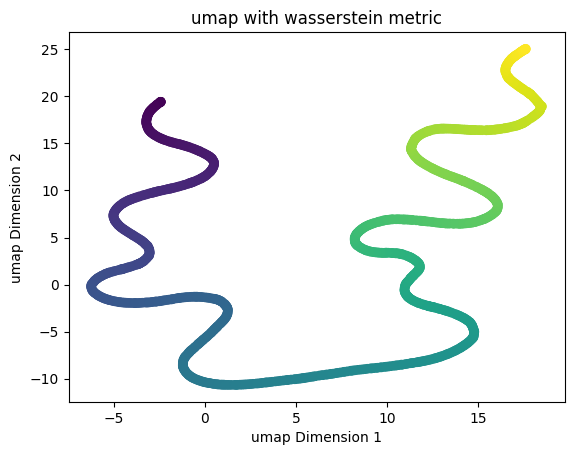

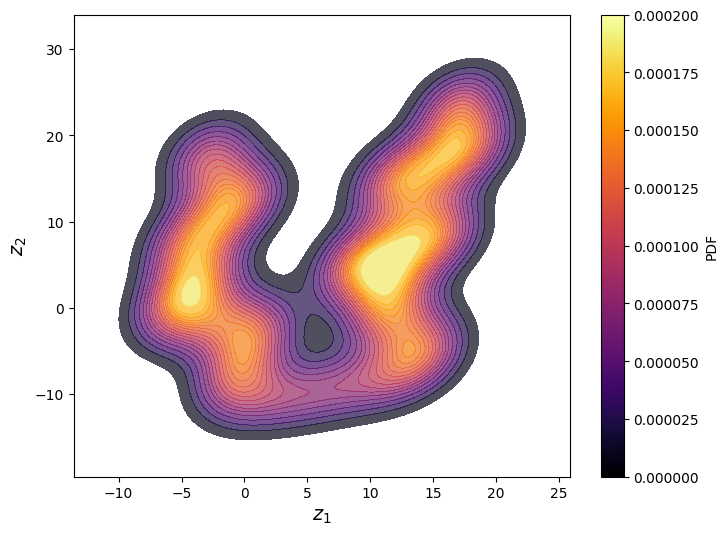

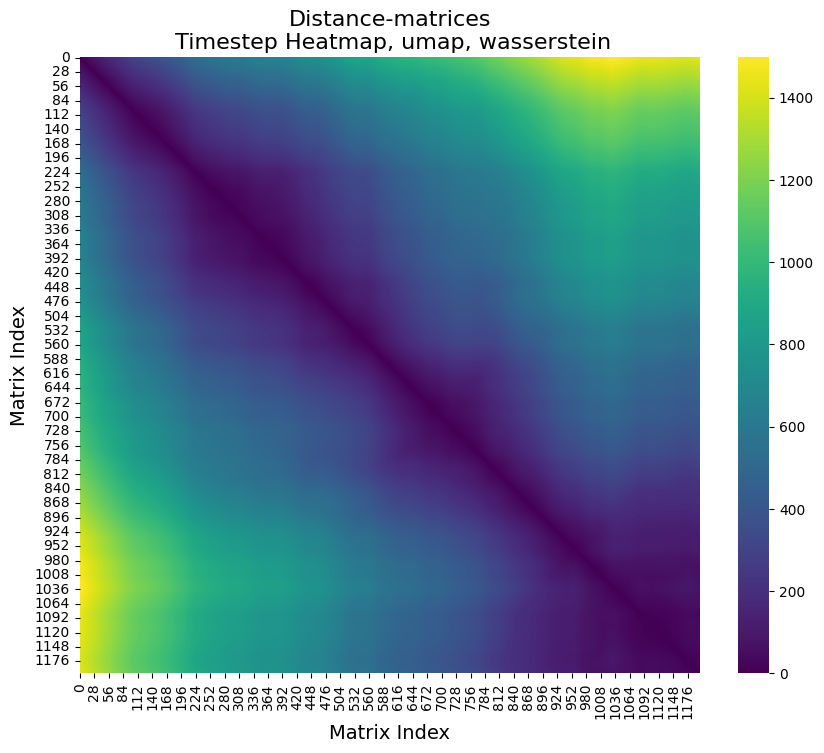

In [22]:
embedding_dist_wass = compute_timestep_clustering(dist_matrices, title_type="Distance-matrices", dim_red="umap", metric="wasserstein", plot_dim_red=True, kde_plot=True, plot_heatmap=True)

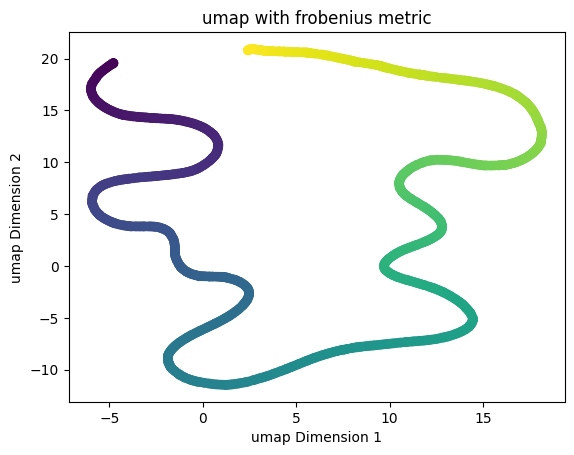

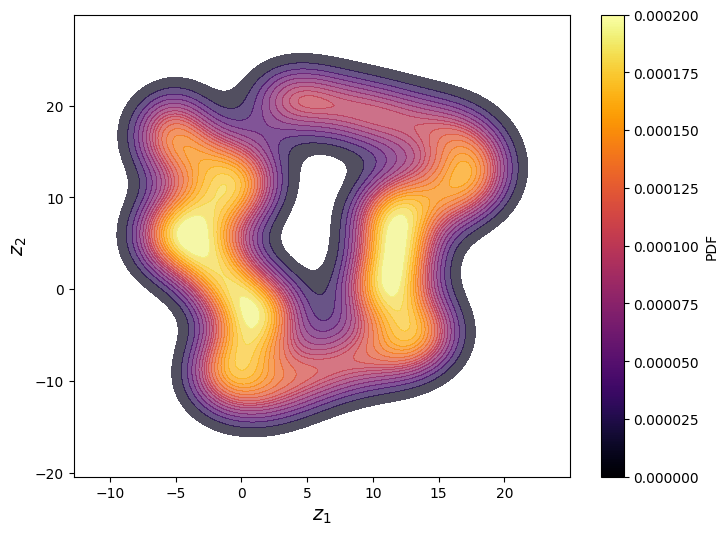

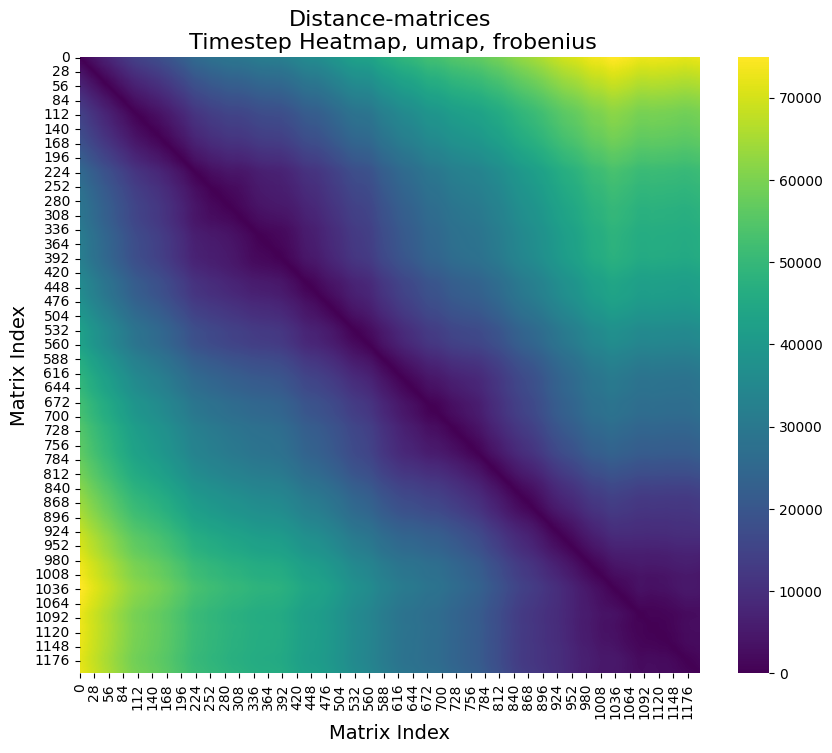

In [23]:
embedding_dist_frob = compute_timestep_clustering(dist_matrices, title_type="Distance-matrices", dim_red="umap", metric="frobenius", plot_dim_red=True, kde_plot=True, plot_heatmap=True)

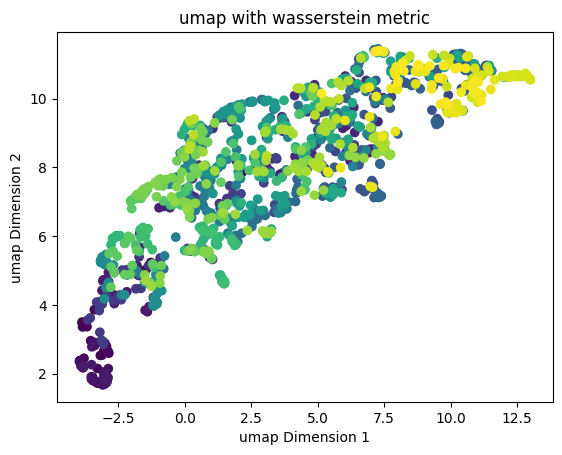

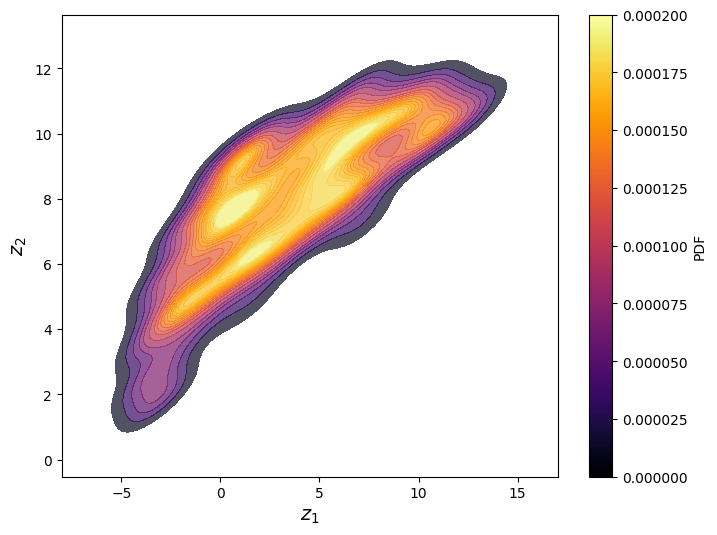

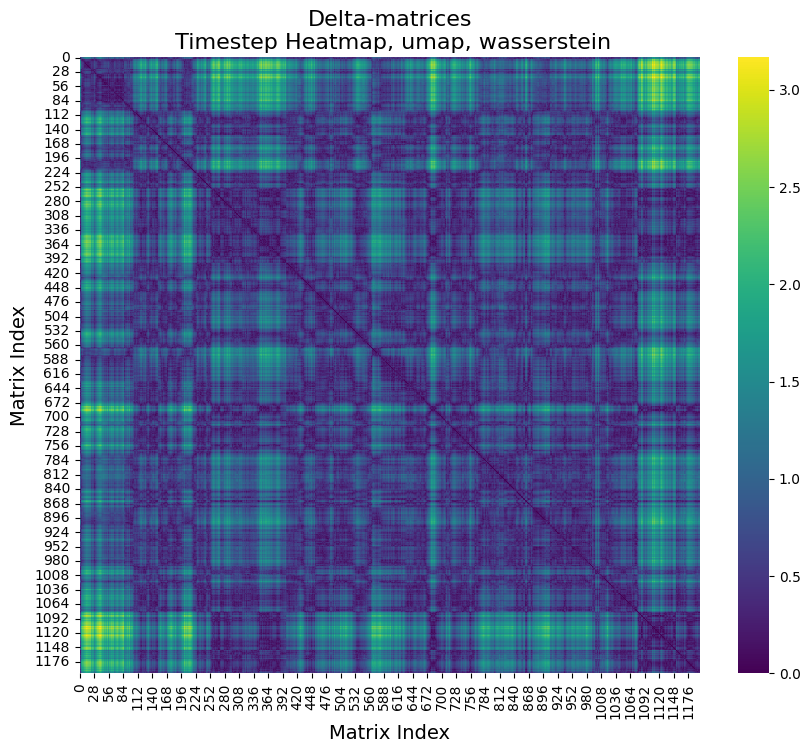

In [24]:
embedding_frobenius = compute_timestep_clustering(delta_matrices, title_type="Delta-matrices", dim_red="umap", metric="wasserstein", plot_dim_red=True, kde_plot=True, plot_heatmap=True)

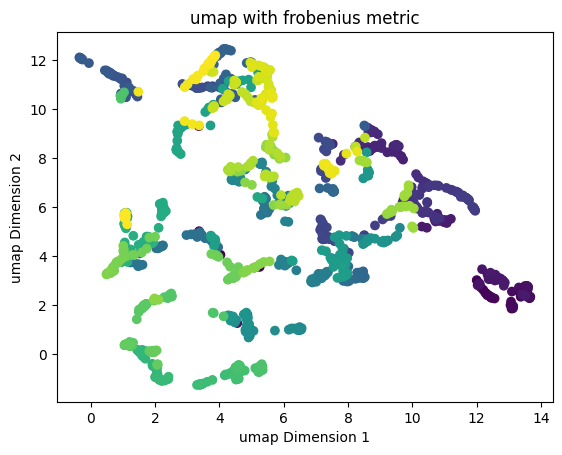

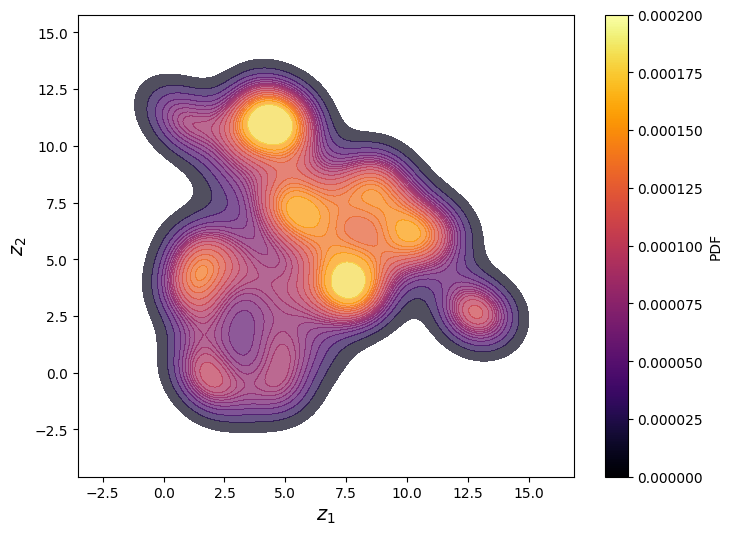

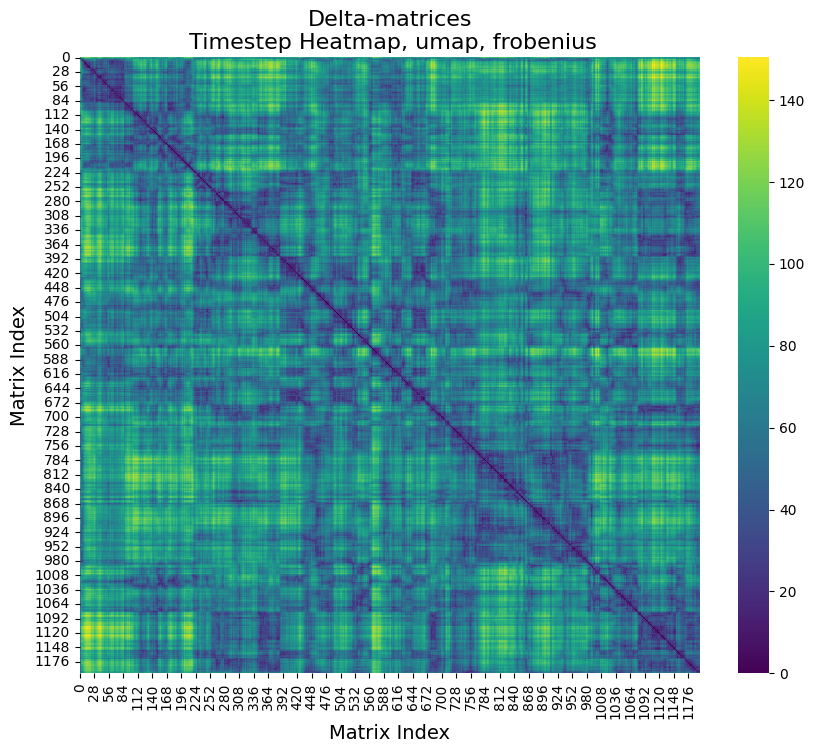

In [25]:
embedding = compute_timestep_clustering(delta_matrices, title_type="Delta-matrices", dim_red="umap", metric="frobenius", plot_dim_red=True, kde_plot=True, plot_heatmap=True)

In [26]:
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=5)  
labels = clusterer.fit_predict(embedding[0])

### For the full trajectory, we get totally unreasonable clustering labels (due to the changes)

In [ ]:
labels

array([-1, 31, 22, ..., 18, 18, 18])

In [28]:
change_points = apply_rpt_change_detection(embedding[0], pen=5)

#### Alternatively - i.e. in case we do not want to rely on UMAP  or a specific change point detection algorithm), we also can detect the changes by computing the distances between adjacent timesteps and look at outliers

In [29]:
from sklearn.preprocessing import StandardScaler
embedding_full_scaled = StandardScaler().fit_transform(embedding[1])

wassermet_mean = compute_adjacent_distances(embedding_full_scaled, distance_type="wasserstein", aggregation="mean")
wassermet_max = compute_adjacent_distances(embedding_full_scaled, distance_type="wasserstein", aggregation="max")

frobenius_mean = compute_adjacent_distances(embedding_full_scaled, distance_type="frobenius", aggregation="mean")
frobenius_max = compute_adjacent_distances(embedding_full_scaled, distance_type="frobenius", aggregation="max")

#### Plots show (as well as the heatmap from above) that change point / outlier detection should be quite possible

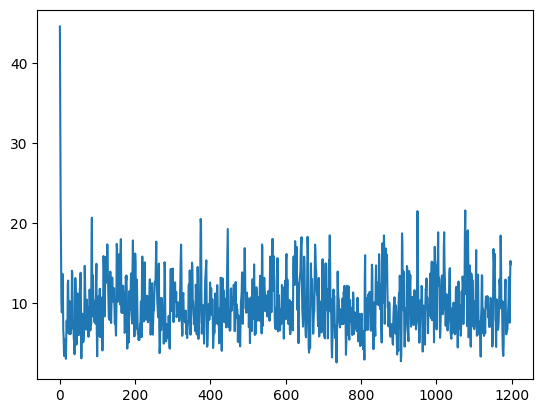

In [30]:
plt.plot(frobenius_mean)

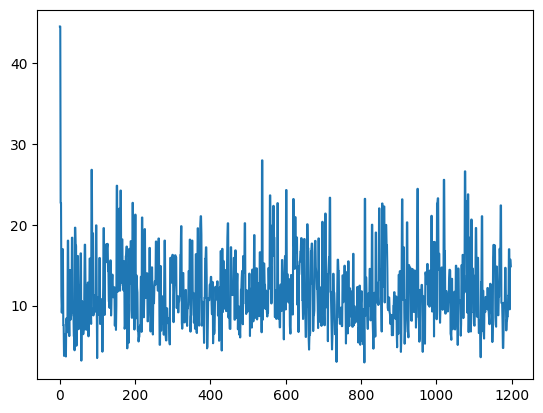

In [31]:
plt.plot(frobenius_max)

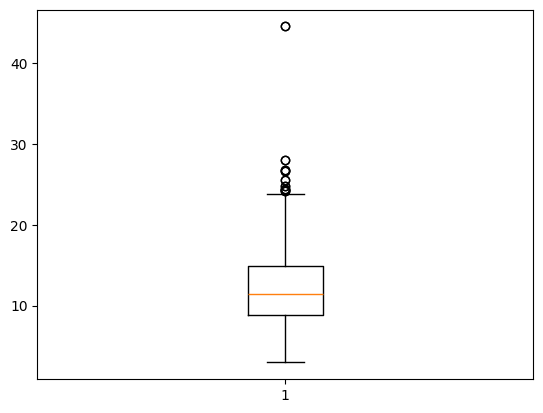

In [32]:
plt.boxplot(frobenius_max)["fliers"]

In [33]:
change_points = distance_outliers(frobenius_max)

In [34]:
change_points

[1]

### Function to get clusterings for all time segments

In [35]:
import clustering_functions
timestep_clusters = clustering_functions.cluster_timesteps_change_points(delta_matrices, change_points, "affinity")

0.0060


In [36]:
timestep_clusters

[{'start': 0,
  'end': 1,
  'clustering': array([6, 1, 1, 1, 1, 0, 1, 0, 6, 4, 2, 2, 2, 2, 4, 4, 1, 2, 5, 3, 4, 3,
         4, 2, 3, 3, 3, 3, 3, 3, 1, 6, 5, 6, 0, 4, 4, 5, 4, 6])}]

In [37]:
timestep_clusters_from_clustering = clustering_functions.cluster_timesteps_from_timestep_clustering(delta_matrices, labels, "affinity")

0.0032
0.0030
0.0020
0.0035
0.0039
0.0050
0.0031
0.0022
0.0022
0.0027
0.0030
0.0037
0.0043
0.0021
0.0020
0.0020
0.0022
0.0048
0.0023
0.0019
0.0020
0.0019
0.0022
0.0060
0.0047
0.0029
0.0021
0.0023
0.0029
0.0023
0.0021
0.0025
0.0024
0.0022
0.0032
0.0020
0.0021
0.0022
0.0044
0.0031
0.0038
0.0022
0.0020
0.0021
0.0023
0.0049
0.0044
0.0023
0.0022
0.0024
0.0024
0.0030
0.0020
0.0019
0.0020
0.0019
0.0023
0.0049
0.0027


0.0047
0.0041
0.0034
0.0040
0.0020
0.0027
0.0031
0.0044
0.0028
0.0022
0.0020
0.0019
0.0023
0.0031
0.0029
0.0022
0.0022
0.0020
0.0021
0.0021
0.0033
0.0022
0.0022


In [38]:
timestep_clusters_from_clustering

[{'indices': array([   0,    3,    4,   33,   68,   86,   87,  104,  150,  151,  161,
          166,  167,  177,  185,  186,  187,  188,  193,  195,  222,  223,
          237,  249,  254,  255,  284,  289,  290,  296,  304,  309,  313,
          343,  350,  352,  353,  362,  366,  386,  387,  389,  401,  445,
          446,  455,  456,  457,  458,  460,  471,  485,  486,  487,  512,
          529,  530,  531,  532,  533,  563,  564,  610,  640,  641,  642,
          643,  644,  645,  647,  648,  650,  656,  658,  663,  666,  670,
          671,  677,  679,  681,  683,  685,  687,  691,  716,  740,  744,
          745,  746,  747,  748,  751,  764,  766,  785,  787,  791,  792,
          806,  808,  809,  810,  865,  867,  869,  894,  922,  928,  929,
          930,  940,  941,  942,  945,  946,  947,  948,  949,  950,  951,
          979,  980,  981,  982,  985,  986,  987,  990,  991,  992, 1019,
         1020, 1027, 1028, 1068, 1071, 1078, 1081, 1082, 1083, 1085, 1104,
         1105,

# Finally, we match the clusterings of the time segments to get a coherent clustering

In [39]:
timestep_clusters_overlap = max_overlap_matching(timestep_clusters)

In [40]:
timestep_clusters

[{'start': 0,
  'end': 1,
  'clustering': array([6, 1, 1, 1, 1, 0, 1, 0, 6, 4, 2, 2, 2, 2, 4, 4, 1, 2, 5, 3, 4, 3,
         4, 2, 3, 3, 3, 3, 3, 3, 1, 6, 5, 6, 0, 4, 4, 5, 4, 6])}]

In [41]:
timestep_clusters_overlap

[{'start': 0,
  'end': 1,
  'clustering': array([6, 1, 1, 1, 1, 0, 1, 0, 6, 4, 2, 2, 2, 2, 4, 4, 1, 2, 5, 3, 4, 3,
         4, 2, 3, 3, 3, 3, 3, 3, 1, 6, 5, 6, 0, 4, 4, 5, 4, 6])}]